In [2]:
import sys
sys.path.append('/home/sergak/.local/lib/python3.8/site-packages')

In [3]:
import warnings
warnings.filterwarnings("ignore")

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import os
import json
import plotly.express as px
import collections
import time

## Read data

In [5]:
PAYMENTS_TRAIN_PATH = 'data/payments_train.csv'
TARGET_TRAIN_PATH = 'data/target_train.csv'
PAYMENTS_TEST_PATH = 'data/payments_test.csv'
CLIENT_ID_TEST_PATH = 'data/client_id_test.csv'
SEED = 42

In [6]:
payments_dtypes = {
    'client_id': str,
    'contractor_id': str,
    'is_outgoing': bool,
    'amount': 'uint64',
    'dt_day': 'uint16',
    'dt_hour': 'uint8',
    'channel': pd.CategoricalDtype()
}
for i in range(12):
    payments_dtypes[f'flag_{i}'] = bool

In [7]:
data = pd.read_csv(PAYMENTS_TRAIN_PATH, dtype=payments_dtypes)
payments_test = pd.read_csv(PAYMENTS_TEST_PATH, dtype=payments_dtypes)

In [8]:
target_dtypes = {
    'client_id': str
}
for i in range(35):
    target_dtypes[f'type_{i}'] = int

In [9]:
target = pd.read_csv(TARGET_TRAIN_PATH, dtype=target_dtypes).set_index('client_id')

In [10]:
data['contractor_id'] = data['contractor_id'].fillna('-1')
payments_test['contractor_id'] = payments_test['contractor_id'].fillna('-1')

## Experements

In [10]:
data.head()

,client_id,contractor_id,is_outgoing,amount,dt_day,dt_hour,channel,flag_0,flag_1,flag_2,flag_3,flag_4,flag_5,flag_6,flag_7,flag_8,flag_9,flag_10,flag_11
0,569703,-1,True,8674442,56,12,app,False,False,False,False,False,False,False,False,False,False,False,False
1,696595,3920,True,5714350,311,19,web,False,False,False,False,False,False,False,False,False,False,False,False
2,368467,-1,True,3720501,175,13,NaN,False,False,False,True,False,False,False,False,False,False,False,False
3,421133,-1,True,311542,68,14,NaN,False,False,False,True,False,False,False,False,False,False,False,False
4,365044,24686,True,705918747,171,15,app,False,False,False,False,False,False,False,False,False,False,False,False


In [11]:
collections.Counter(data['is_outgoing'])

Counter({True: 19292431, False: 6645559})

In [12]:
collections.Counter(data['channel'])

Counter({'app': 1989997,
         'web': 4025543,
         nan: 11746713,
         'pos': 7021875,
         'atm': 1153862})

### Days features

In [13]:
collections.Counter(data[data['client_id'] == '100045']['dt_day']).most_common()[:10]

[(297, 14),
 (360, 9),
 (67, 9),
 (318, 8),
 (295, 8),
 (324, 8),
 (351, 8),
 (344, 8),
 (23, 7),
 (330, 7)]

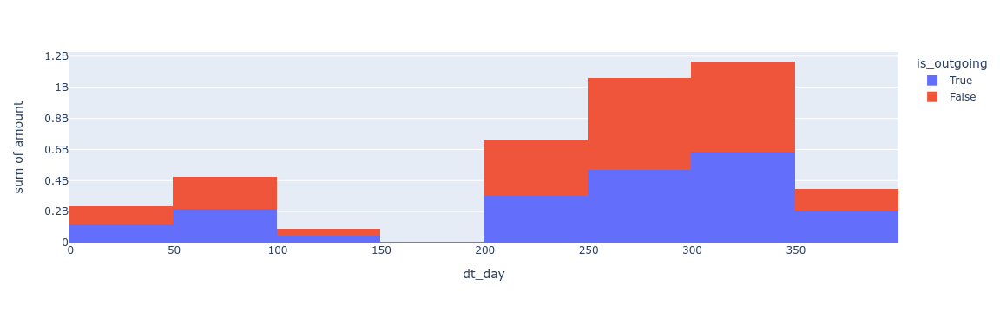

In [14]:
px.histogram(data[data['client_id'] == '100045'], x='dt_day', y='amount', color='is_outgoing')

### Flags data distribution

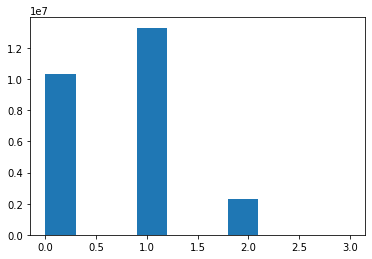

In [11]:
plt.hist(data[['flag_{}'.format(el) for el in range(12)]].sum(axis=1))
plt.show()

In [12]:
double_flags = pd.DataFrame({'client_id': data['client_id']})

for i in range(12):
    for j in range(12):
        double_flags['flag_{}_{}'.format(i, j)] = data['flag_{}'.format(i)] & data['flag_{}'.format(j)]
        if i != j and double_flags['flag_{}_{}'.format(i, j)].sum() > 1000:
            print('Pair flag {} and {}:'.format(i, j), double_flags['flag_{}_{}'.format(i, j)].sum())

Pair flag 0 and 2: 1078485
Pair flag 0 and 4: 3336
Pair flag 0 and 6: 13969
Pair flag 0 and 9: 2458
Pair flag 2 and 0: 1078485
Pair flag 2 and 9: 1524
Pair flag 4 and 0: 3336
Pair flag 4 and 8: 1197298
Pair flag 6 and 0: 13969
Pair flag 8 and 4: 1197298
Pair flag 9 and 0: 2458
Pair flag 9 and 2: 1524


### Contactor_id data

In [13]:
grouped = data.groupby('client_id')['contractor_id']

In [14]:
cnt_equal_trans = []
top_n = []
for name, group in tqdm(grouped):
    now = 0
    for k, v in collections.Counter(group).most_common():
        if k != -1:
            cnt_equal_trans.append(v)
            top_n.append(now)
            now += 1
            
top_n = np.array(top_n)
cnt_equal_trans = np.array(cnt_equal_trans)

100%|███████████████████████████████████| 67005/67005 [00:14<00:00, 4749.59it/s]


In [15]:
len(cnt_equal_trans[top_n < 3]), len(np.unique(cnt_equal_trans[top_n < 3]))

(199445, 1670)

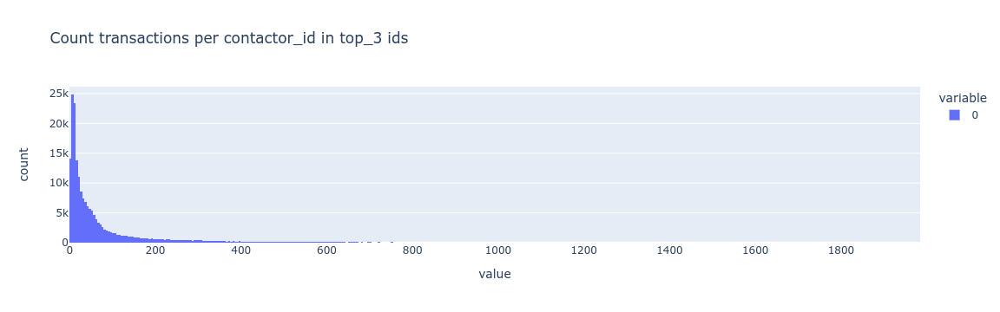

In [16]:
px.histogram(cnt_equal_trans[top_n < 3], title='Count transactions per contactor_id in top_3 ids')

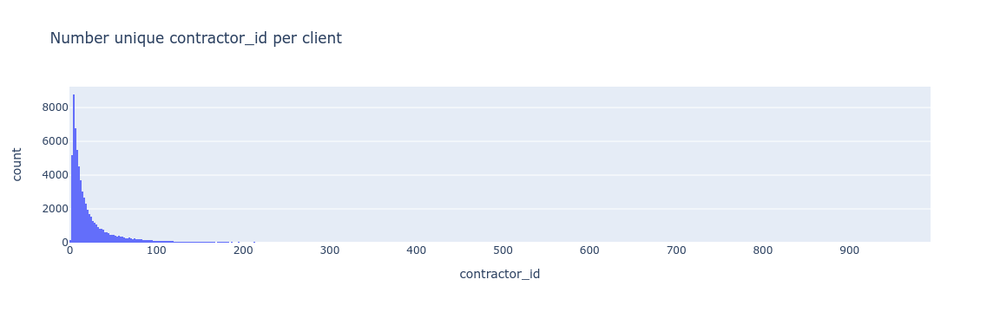

In [17]:
px.histogram(data.groupby('client_id')['contractor_id'].nunique().reset_index(), 
             x='contractor_id', 
             title='Number unique contractor_id per client')

## Contractor id intersection in test/val/train

In [19]:
def build_top_ids_features(res, x):
    grouped = x.groupby('client_id')['contractor_id']
    top_ids = []
    cnt_not_nan_contactor_id = []
    top_k = 10
    for name, group in grouped:
        now = 0
        top_now = []
        cnt = collections.Counter(group).most_common()
        cnt_not_nan_contactor_id.append(0)
        for k, v in cnt:
            cnt_not_nan_contactor_id[-1] += (k != '-1')
            
        for k, v in cnt:
            if k != '-1':
                top_now.append(k)
                
            if len(top_now) == top_k:
                break
                
        top_now += ['-1'] * (top_k - len(top_now))
        top_ids.append(top_now)
    
    res['cnt_not_nan_contactor_id'] = cnt_not_nan_contactor_id
    top_ids = np.array(top_ids)
    for i in range(top_k):
        res['top_{}_id'.format(i)] = top_ids[:, i]
    return res

In [25]:
def get_features(x):
    res = x.groupby(['client_id'])['amount'].agg(['sum', 'median', 'count', 'std'])
    res = build_top_ids_features(res, x)
        
    top_cols = [el for el in res.columns if 'top' in el]
    res[top_cols] = res[top_cols].fillna('-1')
    return res

In [26]:
%%time
features = get_features(data)
X = features
features.head()

CPU times: user 22.7 s, sys: 1.48 s, total: 24.2 s
Wall time: 24.2 s


,sum,median,count,std,cnt_not_nan_contactor_id,top_0_id,top_1_id,top_2_id,top_3_id,top_4_id,top_5_id,top_6_id,top_7_id,top_8_id,top_9_id
client_id,,,,,,,,,,,,,,,
100045,3988708134,1706470.0,477,1.733687e+07,14,100045,578596,77142,587837,404739,979723,395009,393717,15624,574642
100055,14330218840,4010524.0,651,6.029931e+07,42,963007,937459,899676,246855,869701,913518,588855,565756,127119,175742
100068,19630047635,3232108.0,519,8.493012e+07,21,922296,543754,517359,70463,220810,664899,615615,665289,100068,91997
100076,1074700013,1522173.0,93,3.589745e+07,9,28547,747931,907377,517007,673163,567238,509530,182632,549510,-1
100089,48560605079,21997923.0,1584,4.485693e+07,22,174173,14980,926929,863770,344098,299311,960130,555885,589103,257769


In [27]:
def load_splitted_data(X, y, split_idx_file):
    with open(split_idx_file, 'r') as f:
        split_json = json.load(f)
    train_idx, val_idx = split_json['train'], split_json['val']
    return X.loc[train_idx], y.loc[train_idx], X.loc[val_idx], y.loc[val_idx]

In [31]:
X_train, y_train, X_val, y_val = load_splitted_data(X, target, 'split_cache_15.json')

In [37]:
payments_test = pd.read_csv(PAYMENTS_TEST_PATH, dtype=payments_dtypes)
payments_test['contractor_id'] = payments_test['contractor_id'].fillna('-1')

In [36]:
X_test = get_features(payments_test)

In [39]:
X_train.shape, X_val.shape, X_test.shape

((57169, 15), (9836, 15), (22045, 15))

### Intersection between X_train['client_id'] and contractor_id in val/test

In [33]:
def get_contactor_id_intersection_2(X_train, X_test):
    res = {}
    for el in tqdm(X_test.columns):
        if 'top' not in el:
            continue
        
        test_cnt = len(X_test[el].unique())
        train_cnt = len(X_train.index.unique())
        unifiq_cnt = len(np.unique(np.concatenate([X_train.index, X_test[el]], axis=0)))
        res[el] = (test_cnt + train_cnt - unifiq_cnt) / test_cnt
        
    return res

In [34]:
get_contactor_id_intersection_2(X_train , X_val)

100%|███████████████████████████████████████████| 15/15 [00:00<00:00, 25.95it/s]


{'top_0_id': 0.022937681359679427,
 'top_1_id': 0.03503562945368171,
 'top_2_id': 0.0299704516673702,
 'top_3_id': 0.02828975567938277,
 'top_4_id': 0.0308799280467696,
 'top_5_id': 0.024375097034621953,
 'top_6_id': 0.020297029702970298,
 'top_7_id': 0.021853146853146852,
 'top_8_id': 0.02171089255891631,
 'top_9_id': 0.027701911822083494}

In [40]:
get_contactor_id_intersection_2(X_train, X_test)

100%|███████████████████████████████████████████| 15/15 [00:00<00:00, 22.29it/s]


{'top_0_id': 0.022278186749321967,
 'top_1_id': 0.033357041251778095,
 'top_2_id': 0.03134438552923015,
 'top_3_id': 0.02815112002674691,
 'top_4_id': 0.027028904947192886,
 'top_5_id': 0.02638888888888889,
 'top_6_id': 0.02778635381290522,
 'top_7_id': 0.023960880195599023,
 'top_8_id': 0.02697610687676629,
 'top_9_id': 0.021020204765787805}

### Intersection between contractor_id in top_columns in val/test/train

In [41]:
def get_contactor_id_intersection(X_train, X_test):
    res = {}
    for el in tqdm(X_test.columns):
        if 'top' not in el:
            continue
        
        test_cnt = len(X_test[el].unique())
        train_cnt = len(X_train[el].unique())
        unifiq_cnt = len(np.unique(np.concatenate([X_train[el], X_test[el]], axis=0)))
        res[el] = (test_cnt + train_cnt - unifiq_cnt) / test_cnt
        
    return res

In [42]:
get_contactor_id_intersection(X_train, X_val)

100%|███████████████████████████████████████████| 15/15 [00:00<00:00, 21.75it/s]


{'top_0_id': 0.16802542489982036,
 'top_1_id': 0.23292755344418054,
 'top_2_id': 0.2100745743633038,
 'top_3_id': 0.19688526932418918,
 'top_4_id': 0.17853395293059512,
 'top_5_id': 0.17015991305697872,
 'top_6_id': 0.16419141914191418,
 'top_7_id': 0.15664335664335666,
 'top_8_id': 0.14696604193727963,
 'top_9_id': 0.1406554818571986}

In [43]:
get_contactor_id_intersection(X_train, X_test)

100%|███████████████████████████████████████████| 15/15 [00:00<00:00, 17.96it/s]


{'top_0_id': 0.12585561152008265,
 'top_1_id': 0.1852062588904694,
 'top_2_id': 0.17363581448419357,
 'top_3_id': 0.1581410899364761,
 'top_4_id': 0.1466787103946637,
 'top_5_id': 0.14071637426900585,
 'top_6_id': 0.13229391787588762,
 'top_7_id': 0.12705786471067645,
 'top_8_id': 0.12263423824612486,
 'top_9_id': 0.11996013409440971}